# Lab 6: Geodemographics

Student ID: 220015902

# Challenge 1: Geodemographic Classification

In this challenge, you will replicate the process of creating a geodemographic classification using the k-means clustering algorithm. Please select any city in the UK except London, Liverpool, or Glasgow. The main goal is to generate a meaningful and informative classification that captures the diversity of areas in your dataset using the census data ( For England, you can try to use the 2021 or 2011 census, and for Scotland, you need to use the 2011 census data) 

1. Define the main goal for the geodemographic classification (marketing, retail and service planning). 
2. Look for census data from the selected city for which you would like to generate the geodemographic classification.
3. The census data at the Output Area OA level. Select multiple topics of at least four topics (socio-demographics, economics, health, and so on). Describe your topic selection accordingly based on the goal of your geodemographic classification. For example, if your geodemographics are related to marketing, Economic variables might be the appropriate selection. 
4. Identify the variables that will be crucial for effectively segmenting neighbourhoods. Evaluate how this choice may impact the classification results, including a DEA analysis.
5. Prepare, adjust or clean the dataset addressing any missing values or outliers that could distort the clustering results.
6. Include standardisation between areas and variables. Make an appropriate analysis and adjust the variable selection accordingly for any multicollinearity.
7. Utilize the k-means clustering algorithm to create a classification based on the selected variables.
8. Define the optimum number of clusters (i.e., using the Elblow method). Experiment with different values of k.
9. Evaluate your cluster groups (e.g., using PCA) and interpret your cluster centres. Describe your results and repeat the process to adjust the variable selection and cluster groups to provide more meaningful results for your geodemographic goal. Interpret the characteristics of each cluster. What demographic patterns or similarities are prevalent within each group?
10. Map the final cluster groups
11. Finish the analysis by naming the final clusters and plotting a final map that includes the census values and the provided names.
12. Finally, acknowledge the subjective nature of classification and make analytical decisions to produce an optimum classification for your specific purpose. Reflect on the challenges and insights gained during the classification process. Ensure you document your analytical decisions and the rationale behind any important decision. Once your geodemographics are constructed, describe the potential use cases for the geodemographic classification you have built based on your initial goal.

### 1. 

I will use geodemographic classification to assess differences in standards of health across different neighbourhoods in Edinburgh. This is important to understand whether service provision in different areas is sufficient. 

To do this, the geodemographic classification will account for differences in lifestyle, household, health and economic variables for neighbourhoods to assess areas with worse health. I will draw on a previous similar study that applies geodemographics to public health in Greater London (Peterson et al., 2007) to inform my variable selection and analysis.

The following variables will be included to segment neighbourhoods. They are based on a range of factors that make generalisations about how lifestyle choices impact health, as well as general health statistics. 
* UV104 - marital and civil partnership status
* UV301 - provision of unpaid care
* UV302 - General health
* UV303 - Disability
* UV204 - Long-term health conditions
* UV407 - Central heating
* UV501 - Highest level of qualification
* UV601 - Economic Activity
* UV606 - Occupation
* UV703 - Distance travelled to work

(https://www.scotlandscensus.gov.uk/documents/2022-output-area-data/)

It is likely that the choice to include both economic activity, highest level of qualification and hours worked will be highly correlated and may need to be removed to avoid skewing results and keeping unique variables.

In [1]:
cd ..

/Users/milliemccallum/Documents/Lab_assignment_2


### Preprocessing the census data 

In [128]:
import pandas as pd
import os

csv_directory = "Data/data_6/challenge_data/census_2022/raw_data/"

# create a list for the CSVs that will be used for the directory
csv_files = [file for file in os.listdir(csv_directory) if file.endswith(".csv")]

# Create an empty dataframe to put the merged set of csvs into
merged_data = pd.DataFrame()

# read the csvs and merge them
for csv_file in csv_files:
    csv_path = os.path.join(csv_directory, csv_file) 
    df_csv = pd.read_csv(csv_path, low_memory=False) 
    merged_data = pd.concat([merged_data, df_csv], axis=1)

merged_data.to_csv("Data/data_6/challenge_data/census_2022/merged_census_data.csv", index=False)

merged_data.head()

,oa_code,All people aged 16 and over in employment the week before the census (including full-time students if they gave a work address as the address they primarily travel to for work or study),Mainly work from home,Less than 2km,2km to less than 5km,5km to less than 10km,10km to less than 20km,20km to less than 30km,30km to less than 40km,40km to less than 60km,...,Gas central heating: Mains gas,Gas central heating: Other gas (including liquid petroleum gas and biogas),Electric (including storage heaters) central heating,Oil central heating,Solid Fuel (excluding wood),"Wood or Biomass (including logs, pellets, chippings) central heating",Other renewable energy source (including electric and air heat pump systems),District or communal heat system,Other central heating,Two or more types of central heating
0,S00135307,69,25,4,8,12,14,-,1,-,...,9,11,1,29,-,4,1,-,-,8
1,S00135308,40,12,-,3,5,11,-,-,1,...,1,2,3,14,1,-,-,-,1,3
2,S00135309,78,23,4,10,23,4,-,-,-,...,22,6,4,24,5,-,2,-,1,6
3,S00135310,97,30,9,13,20,8,1,-,-,...,55,-,1,2,-,-,-,-,1,5
4,S00135311,92,27,3,21,27,4,2,-,1,...,27,1,1,20,-,-,2,-,-,10


In [99]:
# create a filter for only Edinburgh so data only reflects this area, not the whole of Scotland 
# first filter the oa data to just the extent of Edinburgh 
# This is using data from https://geoportal.statistics.gov.uk/datasets/ons::local-authority-districts-may-2024-boundaries-uk-bfe-2/about 
# showing the boundaries of local authorities. I will select only the City of Edinburgh
# Due to the large file size of this data, please download it seperately into your on drive

import pandas as pd
import geopandas as gpd

shp_path = "Data/data_6/challenge_data/edinburgh_oa/LAD_MAY_2024_UK_BFE.shp"
local_authorities = gpd.read_file(shp_path)

edinburgh = local_authorities[local_authorities["LAD24NM"] == "City of Edinburgh"]
edinburgh.head()

,LAD24CD,LAD24NM,LAD24NMW,BNG_E,BNG_N,LONG,LAT,geometry
328,S12000036,City of Edinburgh,NaN,320193,669417,-3.27826,55.9112,"MULTIPOLYGON (((313649.660 679534.410, 313650...."


EPSG:27700
EPSG:27700


<Axes: >

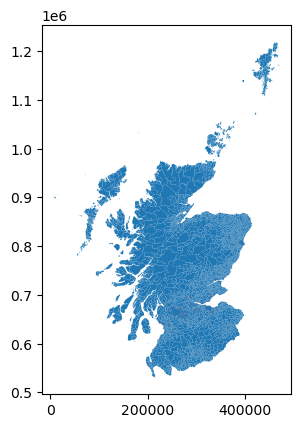

In [104]:
# get the shapefile for the output areas of the whole of Scotland 
# and use the local authority outline to clip the output areas to the extent of Edinburgh 
oa_path = "Data/data_6/challenge_data/edinburgh_oa/OutputArea2022_EoR.shp"
oa = gpd.read_file(oa_path)

# check crs match
print(oa.crs)
print(edinburgh.crs)
oa.plot()

In [ ]:
# clipping the oa data to the extent of edinburgh

oa_edinburgh = oa.clip(edinburgh)
oa_edinburgh.head()

<Axes: >

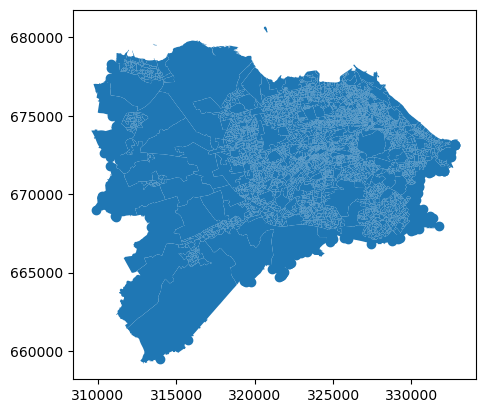

In [123]:
oa_edinburgh.plot()

In [129]:
# merging the oa data with the census data

import pandas as pd
import geopandas as gpd

csv_path = "Data/data_6/challenge_data/census_2022/merged_census_data.csv"
csv_data = pd.read_csv(csv_path, low_memory=False)
csv_data.head()

In [ ]:
merged_data = oa_edinburgh.merge(csv_data, left_on='code', right_on='Unnamed: 0', how='left')

In [131]:
# save to file so if kernel is restarted, can skip the above steps without duplicating data
merged_data.to_csv("Data/data_6/challenge_data/census_2022/census_oa", index=False)

### Processing the variables

In [2]:
# check what columns are present 
import pandas as pd
import geopandas as gpd

merged_data = pd.read_csv("Data/data_6/challenge_data/census_2022/census_oa", low_memory=False)
list(merged_data.columns)

['code',
 'HHcount',
 'Popcount',
 'council',
 'sqkm',
 'hect',
 'masterpc',
 'easting',
 'northing',
 'Shape_Leng',
 'Shape_Area',
 'geometry',
 'oa_code',
 'All people aged 16 and over in employment the week before the census (including full-time students if they gave a work address as the address they primarily travel to for work or study)',
 'Mainly work from home',
 'Less than 2km',
 '2km to less than 5km',
 '5km to less than 10km',
 '10km to less than 20km',
 '20km to less than 30km',
 '30km to less than 40km',
 '40km to less than 60km',
 '60km and over',
 'Other - No fixed place of work or working outside the UK',
 'Unnamed: 0',
 'All people aged 16 and over',
 'Economically Active (excluding full time students) - Total',
 'Economically Active (excluding full-time students) - Employee - Total',
 'Economically Active (excluding full-time students) - Employee - Part-time',
 'Economically Active (excluding full-time students) - Employee - Full-time',
 'Economically Active (excludin

In [3]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4452 entries, 0 to 4451
Columns: 155 entries, code to Two or more types of central heating
dtypes: float64(15), int64(14), object(126)
memory usage: 5.3+ MB


In [4]:
merged_data.shape
# get an idea of the number of columns/rows

(4452, 155)

In [5]:
merged_data.head()

,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,Shape_Leng,...,Gas central heating: Mains gas,Gas central heating: Other gas (including liquid petroleum gas and biogas),Electric (including storage heaters) central heating,Oil central heating,Solid Fuel (excluding wood),"Wood or Biomass (including logs, pellets, chippings) central heating",Other renewable energy source (including electric and air heat pump systems),District or communal heat system,Other central heating,Two or more types of central heating
0,S00181358,57,152,S12000040,42.406623,4240.66,EH27 8DJA,311694,664406,40559.974240,...,6,4,2,34,-,2,2,-,-,8
1,S00145082,53,107,S12000036,0.015435,1.54,EH13 9AG,322867,669374,522.905774,...,43,-,5,-,-,-,-,-,-,4
2,S00144968,74,163,S12000036,0.364902,36.49,EH13 0PS,322069,669312,3842.367627,...,45,-,8,-,-,-,-,6,-,7
3,S00145050,73,161,S12000036,0.027922,2.79,EH13 9AW,323016,669327,1189.877306,...,63,-,4,-,-,-,-,-,-,4
4,S00145009,41,107,S12000036,0.059002,5.90,EH13 9DS,322836,669578,1700.931906,...,34,-,3,-,-,-,-,-,-,1


### Identifying key variables

In [6]:
# sumarising variables that might be helpful to address the research question
merged_data['Bad'].describe()

count     4452
unique      31
top          2
freq       620
Name: Bad, dtype: object

In [7]:
merged_data['Economically Active full-time students - Employee - Part-time'].describe()

count     4452
unique      68
top          -
freq       966
Name: Economically Active full-time students - Employee - Part-time, dtype: object

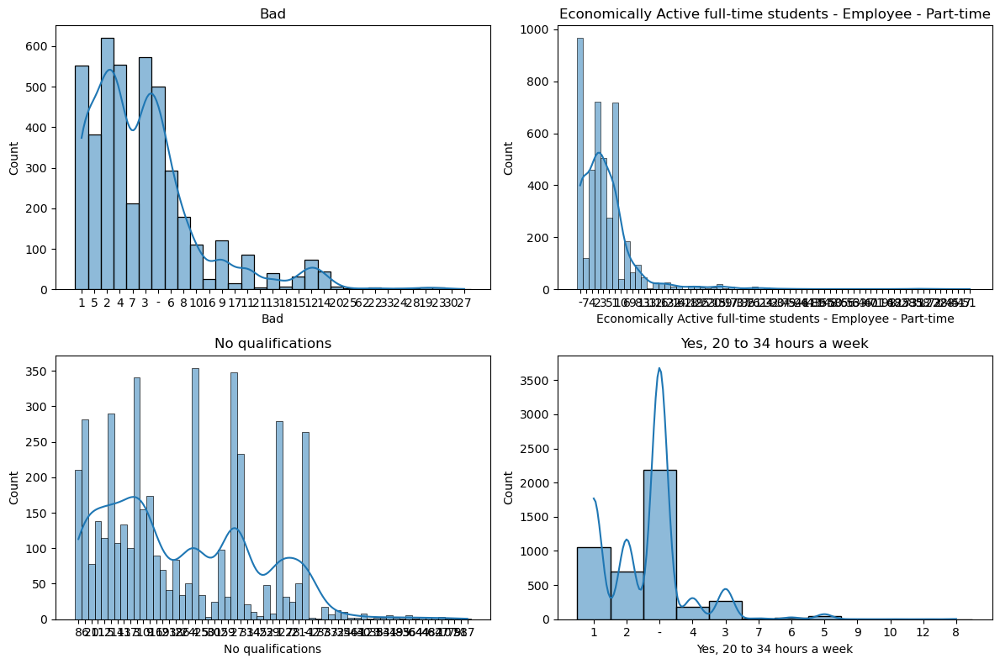

In [8]:
# plot some different variables to assess their distribution in Edinburgh 
# to inform variable choices in the next step
import seaborn as sns
import matplotlib.pyplot as plt

attributes_to_plot = ['Bad',
                      'Economically Active full-time students - Employee - Part-time',
                      'No qualifications',
                      'Yes, 20 to 34 hours a week']

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 2, i)
    sns.histplot(merged_data[attribute].astype(str), kde=True)
    plt.title(attribute)

plt.tight_layout()
plt.show()

### Standardising and subsetting the data 

21 variables have been selected from aspects of the census data on the following topics that are related to health, wealth, lifestyle and household choices: 
* Health
* Education
* Employment
* Economic circumstances
* Relationship status
* Housing 

In [9]:
# creating a function to make a subset of the data with the percentage of each variable
# for the output areas
# the function takes the important categories of variables and makes them a percentage of 
# the total number of respondents in that variable 

def calculate_percentages(dataframe, total_columns, value_columns):

    result_df = pd.DataFrame()

    for total_col, value_col in zip(total_columns, value_columns):
        percentage_col_name = f"{value_col}_percentage"

        if total_col not in dataframe.columns:
            raise ValueError(f"Total column '{total_col}' not found in the DataFrame.")
        dataframe[value_col] = pd.to_numeric(dataframe[value_col], errors='coerce')
        dataframe[total_col] = pd.to_numeric(dataframe[total_col], errors='coerce')
        
        result_df[percentage_col_name] = (dataframe[value_col] / dataframe[total_col]) * 100

    return result_df

# List of the corresponding totals.
total_cols = [
              'All people aged 16 and over', 'All people aged 16 and over', 
              'All people.1', 'All people.1',
              'All people.2','All people.2',
              'All people aged 16 and over.1', 'All people aged 16 and over.1',
              'All people aged 16 and over.2','All people aged 16 and over.2', 'All people aged 16 and over.2',
              'All people aged 3 and over', 'All people aged 3 and over',
              'All people aged 16 and over in employment the week before the census.1', 'All people aged 16 and over in employment the week before the census.1']
# List of the corresponding values. 
value_cols = [
              'Economically Active (excluding full-time students) - Employee - Part-time', 'Economically Active (excluding full-time students) - Unemployed - Available for work',
              'Long-term illness, disease or condition', 'Mental health condition',
              'Bad', 'Very bad',
              'Divorced or civil partnership dissolved', 'Never married and never registered in a civil partnership',
              'No qualifications', 'Lower school qualifications', 'Upper school qualifications',
              'Yes, 35 to 49 hours a week', 'Yes, 50 or more hours a week',
              'Day-to-day activities limited a little',
              '16 to 30 hours', '31 to 48 hours']
              
result_dataframe = calculate_percentages(merged_data, total_cols, value_cols)
              

In [10]:
# check to see the new values to see if it has worked
list(result_dataframe.columns)

['Economically Active (excluding full-time students) - Employee - Part-time_percentage',
 'Economically Active (excluding full-time students) - Unemployed - Available for work_percentage',
 'Long-term illness, disease or condition_percentage',
 'Mental health condition_percentage',
 'Bad_percentage',
 'Very bad_percentage',
 'Divorced or civil partnership dissolved_percentage',
 'Never married and never registered in a civil partnership_percentage',
 'No qualifications_percentage',
 'Lower school qualifications_percentage',
 'Upper school qualifications_percentage',
 'Yes, 35 to 49 hours a week_percentage',
 'Yes, 50 or more hours a week_percentage',
 'Day-to-day activities limited a little_percentage',
 '16 to 30 hours_percentage']

In [11]:
result_dataframe.shape

(4452, 15)

In [12]:
# combine the percentage dataframe with the original dataframe to get all columns 

concatenated_df = pd.concat([merged_data, result_dataframe], axis=1, ignore_index=False)
concatenated_df.head()

,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,Shape_Leng,...,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage
0,S00181358,57,152,S12000040,42.406623,4240.66,EH27 8DJA,311694,664406,40559.974240,...,NaN,7.086614,22.047244,6.299213,9.448819,4.724409,NaN,1.342282,18.478261,15.217391
1,S00145082,53,107,S12000036,0.015435,1.54,EH13 9AG,322867,669374,522.905774,...,0.934579,14.942529,43.678161,6.896552,18.390805,13.793103,NaN,1.886792,27.118644,25.423729
2,S00144968,74,163,S12000036,0.364902,36.49,EH13 0PS,322069,669312,3842.367627,...,0.952381,4.761905,32.142857,11.904762,27.380952,13.690476,0.518135,2.072539,24.509804,10.784314
3,S00145050,73,161,S12000036,0.027922,2.79,EH13 9AW,323016,669327,1189.877306,...,0.621118,10.236220,37.795276,8.661417,26.771654,7.874016,NaN,1.923077,14.772727,17.045455
4,S00145009,41,107,S12000036,0.059002,5.90,EH13 9DS,322836,669578,1700.931906,...,1.869159,10.227273,37.500000,13.636364,35.227273,2.272727,0.980392,4.901961,18.181818,25.454545


In [13]:
# check the number of columns now present in the dataset 
concatenated_df.shape

(4452, 170)

In [14]:
list(concatenated_df.columns)

['code',
 'HHcount',
 'Popcount',
 'council',
 'sqkm',
 'hect',
 'masterpc',
 'easting',
 'northing',
 'Shape_Leng',
 'Shape_Area',
 'geometry',
 'oa_code',
 'All people aged 16 and over in employment the week before the census (including full-time students if they gave a work address as the address they primarily travel to for work or study)',
 'Mainly work from home',
 'Less than 2km',
 '2km to less than 5km',
 '5km to less than 10km',
 '10km to less than 20km',
 '20km to less than 30km',
 '30km to less than 40km',
 '40km to less than 60km',
 '60km and over',
 'Other - No fixed place of work or working outside the UK',
 'Unnamed: 0',
 'All people aged 16 and over',
 'Economically Active (excluding full time students) - Total',
 'Economically Active (excluding full-time students) - Employee - Total',
 'Economically Active (excluding full-time students) - Employee - Part-time',
 'Economically Active (excluding full-time students) - Employee - Full-time',
 'Economically Active (excludin

In [15]:
# make a new subset of only the important columns 
# this includes the percentage columns and key identifying columns

keep_cols= ['code',
    'Popcount',
    'HHcount',
    'geometry',
    'Economically Active (excluding full-time students) - Employee - Part-time_percentage',
    'Economically Active (excluding full-time students) - Unemployed - Available for work_percentage',
    'Long-term illness, disease or condition_percentage',
    'Mental health condition_percentage',
    'Bad_percentage',
    'Very bad_percentage',
    'Divorced or civil partnership dissolved_percentage',
    'Never married and never registered in a civil partnership_percentage',
    'No qualifications_percentage',
    'Lower school qualifications_percentage',
    'Upper school qualifications_percentage',
    'Yes, 35 to 49 hours a week_percentage',
    'Yes, 50 or more hours a week_percentage',
    'Day-to-day activities limited a little_percentage',
    '16 to 30 hours_percentage']

edinburgh_census_data = concatenated_df[keep_cols]

In [16]:
edinburgh_census_data.head()

,code,Popcount,HHcount,geometry,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,"Long-term illness, disease or condition_percentage",Mental health condition_percentage,Bad_percentage,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage
0,S00181358,152,57,MULTIPOLYGON (((311997.1772359935 665293.93999...,18.110236,0.787402,17.763158,10.526316,0.657895,NaN,7.086614,22.047244,6.299213,9.448819,4.724409,NaN,1.342282,18.478261,15.217391
1,S00145082,107,53,"POLYGON ((322938.99959999975 669278, 322859.99...",16.091954,2.298851,21.495327,14.953271,4.672897,0.934579,14.942529,43.678161,6.896552,18.390805,13.793103,NaN,1.886792,27.118644,25.423729
2,S00144968,163,74,"POLYGON ((322558.1286000004 669284.7050000001,...",6.547619,NaN,13.333333,4.761905,0.952381,0.952381,4.761905,32.142857,11.904762,27.380952,13.690476,0.518135,2.072539,24.509804,10.784314
3,S00145050,161,73,"POLYGON ((323159.99959999975 669427, 323155.99...",15.748031,2.362205,11.801242,12.422360,2.484472,0.621118,10.236220,37.795276,8.661417,26.771654,7.874016,NaN,1.923077,14.772727,17.045455
4,S00145009,107,41,"POLYGON ((322732.9985999996 669511, 322827.999...",13.636364,2.272727,18.691589,17.757009,3.738318,1.869159,10.227273,37.500000,13.636364,35.227273,2.272727,0.980392,4.901961,18.181818,25.454545


In [17]:
edinburgh_census_data.shape

(4452, 19)

### Standardising variables and measuring for association

In [18]:
# check the data types that are present in the new dataframe 
edinburgh_census_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4452 entries, 0 to 4451
Data columns (total 19 columns):
 #   Column                                                                                           Non-Null Count  Dtype  
---  ------                                                                                           --------------  -----  
 0   code                                                                                             4452 non-null   object 
 1   Popcount                                                                                         4452 non-null   int64  
 2   HHcount                                                                                          4452 non-null   int64  
 3   geometry                                                                                         4452 non-null   object 
 4   Economically Active (excluding full-time students) - Employee - Part-time_percentage             4433 non-null   float64
 5   Econom

In [19]:
# calculate Z score for the variables selected which shows correlation between variables

numeric_columns = edinburgh_census_data.select_dtypes(include=['float64'])
z_score_df = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_df.head()

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,"Long-term illness, disease or condition_percentage",Mental health condition_percentage,Bad_percentage,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage
0,1.610692,-1.014503,-0.122594,-0.237394,-1.108017,NaN,-0.126121,-1.197621,-0.506499,-0.626430,-1.013184,NaN,-0.751736,-0.202272,-0.624306
1,1.173324,-0.186741,0.419851,0.448173,0.063994,-0.730556,1.621516,-0.137614,-0.440552,0.430792,0.425491,NaN,-0.455908,0.016246,0.744991
2,-0.894965,NaN,-0.766438,-1.130082,-1.022054,-0.719932,-0.643279,-0.702893,0.112360,1.493707,0.409210,-1.108015,-0.354993,-0.049732,-1.219055
3,1.098794,-0.152045,-0.989117,0.056231,-0.574825,-0.917644,0.574545,-0.425901,-0.245709,1.421669,-0.513524,NaN,-0.436195,-0.295986,-0.379051
4,0.641189,-0.201048,0.012347,0.882365,-0.208817,-0.172759,0.572554,-0.440370,0.303531,2.421386,-1.402124,-0.705606,1.182209,-0.209769,0.749125


In [20]:
# use the z-score to test for any correlations between variables
# the darker the colour, the more highly correlated the variables are 
# create a plot to visually represent this using .corr

corr = z_score_df.corr()
corr.style.background_gradient(cmap='coolwarm')

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,"Long-term illness, disease or condition_percentage",Mental health condition_percentage,Bad_percentage,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage
Economically Active (excluding full-time students) - Employee - Part-time_percentage,1.000000,0.099393,0.050516,-0.070301,0.075562,0.008978,0.147584,-0.225020,0.233672,0.395756,-0.215109,0.114982,0.143375,-0.092225,0.535060
Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,0.099393,1.000000,0.010930,0.244844,0.207485,0.136331,0.179562,0.170028,0.213688,0.219199,-0.130148,0.172068,0.089596,0.034487,0.084777
"Long-term illness, disease or condition_percentage",0.050516,0.010930,1.000000,0.095103,0.532513,0.455958,0.381021,-0.354463,0.501726,0.306655,-0.241566,0.146577,0.250644,0.349286,0.158865
Mental health condition_percentage,-0.070301,0.244844,0.095103,1.000000,0.446545,0.331135,0.227370,0.638917,0.297031,0.193576,0.128158,0.191076,0.109475,0.074319,0.098770
Bad_percentage,0.075562,0.207485,0.532513,0.446545,1.000000,0.435413,0.489001,0.028675,0.666479,0.452229,-0.176357,0.246312,0.311880,0.280681,0.257568
Very bad_percentage,0.008978,0.136331,0.455958,0.331135,0.435413,1.000000,0.354721,0.002745,0.456872,0.269628,-0.156083,0.216419,0.291311,0.145878,0.154864
Divorced or civil partnership dissolved_percentage,0.147584,0.179562,0.381021,0.227370,0.489001,0.354721,1.000000,-0.080900,0.495746,0.373182,-0.228496,0.227662,0.161639,0.204320,0.190859
Never married and never registered in a civil partnership_percentage,-0.225020,0.170028,-0.354463,0.638917,0.028675,0.002745,-0.080900,1.000000,-0.092041,-0.092042,0.327089,0.078920,-0.095654,-0.126786,-0.081078
No qualifications_percentage,0.233672,0.213688,0.501726,0.297031,0.666479,0.456872,0.495746,-0.092041,1.000000,0.605297,-0.233974,0.232204,0.374212,0.262407,0.376128
Lower school qualifications_percentage,0.395756,0.219199,0.306655,0.193576,0.452229,0.269628,0.373182,-0.092042,0.605297,1.000000,-0.161399,0.248620,0.327497,0.135052,0.365633


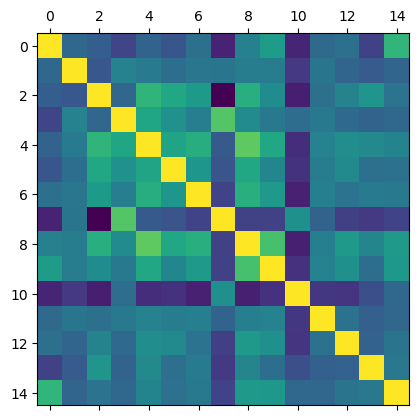

In [21]:
# using an easier to read version of the above plot to identify correlated variables

import matplotlib.pyplot as plt

plt.matshow(z_score_df.corr())
plt.show()

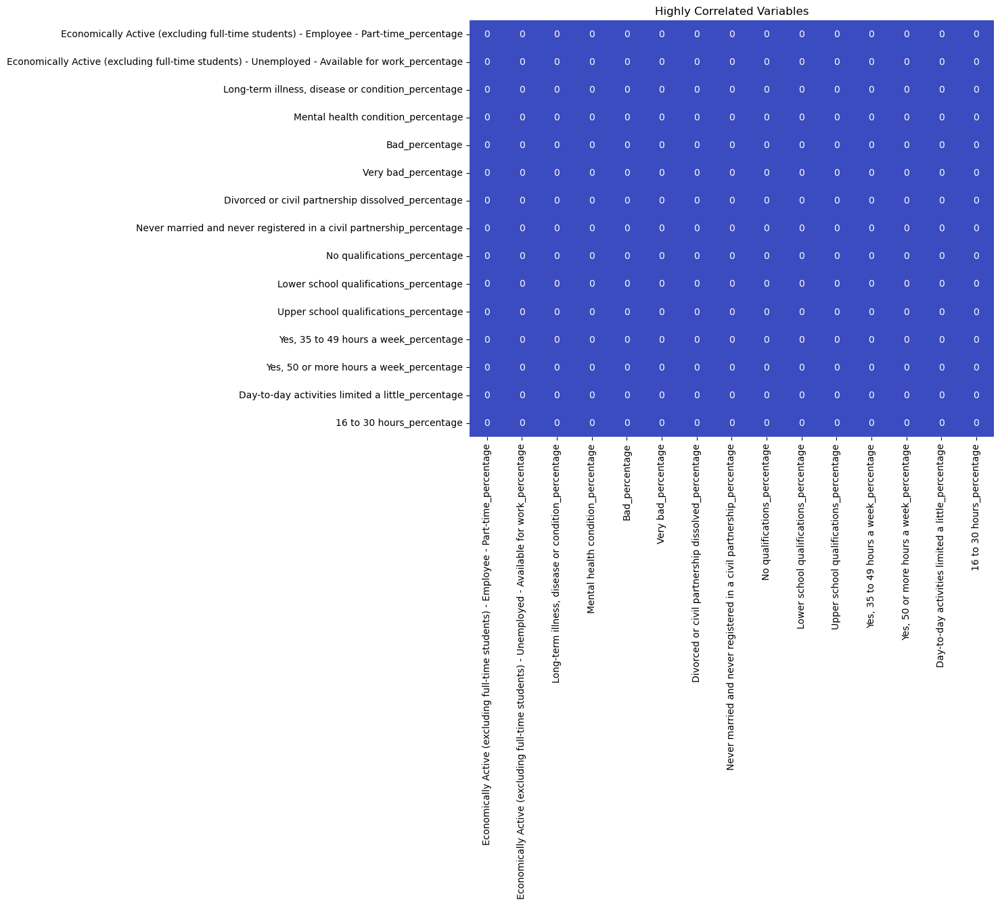

In [22]:
import seaborn as sns

threshold = 0.8
# set the threshold to 0.8 based on the correlations in the above plot

highly_correlated = (corr.abs() > threshold) & (corr.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show()

No variables are very highly correlated therefore these variables are suitable and multicolinearity is not an issue for this varibale selection 

In [23]:
# check for nan values in the df
# as this is true, the next steps remove these values
contains_nan = z_score_df.isna().any().any()
print(contains_nan)

True


In [24]:
# use imputation to fill the nan values with the mean value of that column 

z_score_df.fillna(z_score_df.mean(), inplace=True)
z_score_df.head()

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,"Long-term illness, disease or condition_percentage",Mental health condition_percentage,Bad_percentage,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage
0,1.610692,-1.014503e+00,-0.122594,-0.237394,-1.108017,-1.204796e-16,-0.126121,-1.197621,-0.506499,-0.626430,-1.013184,4.961891e-17,-0.751736,-0.202272,-0.624306
1,1.173324,-1.867411e-01,0.419851,0.448173,0.063994,-7.305562e-01,1.621516,-0.137614,-0.440552,0.430792,0.425491,4.961891e-17,-0.455908,0.016246,0.744991
2,-0.894965,-1.154130e-16,-0.766438,-1.130082,-1.022054,-7.199315e-01,-0.643279,-0.702893,0.112360,1.493707,0.409210,-1.108015e+00,-0.354993,-0.049732,-1.219055
3,1.098794,-1.520445e-01,-0.989117,0.056231,-0.574825,-9.176436e-01,0.574545,-0.425901,-0.245709,1.421669,-0.513524,4.961891e-17,-0.436195,-0.295986,-0.379051
4,0.641189,-2.010478e-01,0.012347,0.882365,-0.208817,-1.727585e-01,0.572554,-0.440370,0.303531,2.421386,-1.402124,-7.056065e-01,1.182209,-0.209769,0.749125


### K-means clustering

In [25]:
# To create categorisations based on variables, k-means clustering is a useful tool 
# this will assess the percentages of categories in each neighbourhood (OA) and create clusters

from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist

# Start analysis with KMeans clustering with 10 clusters
kmeans = KMeans(n_clusters=10)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_
z_score_df['Cluster'] = kmeans.labels_

In [26]:
z_score_df.head()

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,"Long-term illness, disease or condition_percentage",Mental health condition_percentage,Bad_percentage,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage,Cluster
0,1.610692,-1.014503e+00,-0.122594,-0.237394,-1.108017,-1.204796e-16,-0.126121,-1.197621,-0.506499,-0.626430,-1.013184,4.961891e-17,-0.751736,-0.202272,-0.624306,4
1,1.173324,-1.867411e-01,0.419851,0.448173,0.063994,-7.305562e-01,1.621516,-0.137614,-0.440552,0.430792,0.425491,4.961891e-17,-0.455908,0.016246,0.744991,5
2,-0.894965,-1.154130e-16,-0.766438,-1.130082,-1.022054,-7.199315e-01,-0.643279,-0.702893,0.112360,1.493707,0.409210,-1.108015e+00,-0.354993,-0.049732,-1.219055,1
3,1.098794,-1.520445e-01,-0.989117,0.056231,-0.574825,-9.176436e-01,0.574545,-0.425901,-0.245709,1.421669,-0.513524,4.961891e-17,-0.436195,-0.295986,-0.379051,1
4,0.641189,-2.010478e-01,0.012347,0.882365,-0.208817,-1.727585e-01,0.572554,-0.440370,0.303531,2.421386,-1.402124,-7.056065e-01,1.182209,-0.209769,0.749125,5


(array([ 241.,  573.,  423.,  699., 1034.,  442.,   12.,  338.,  545.,
         145.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <BarContainer object of 10 artists>)

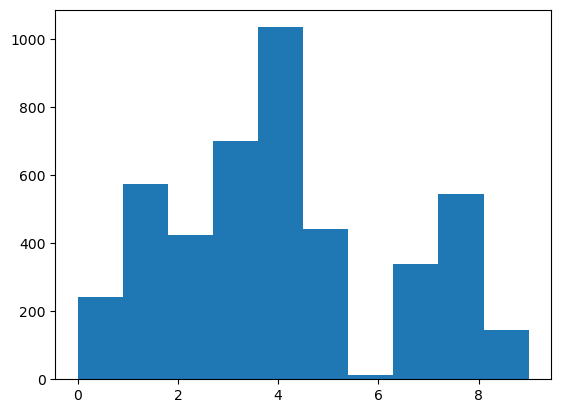

In [27]:
plt.hist(labels)

while there are neighbourhoods matching all of the clusters, there is not an even distribution throughout and cluster 6 has a very low number of neighbourhoods assigned to it. I will therefore use the elbow method to assess what a more suitable number of clusters may be

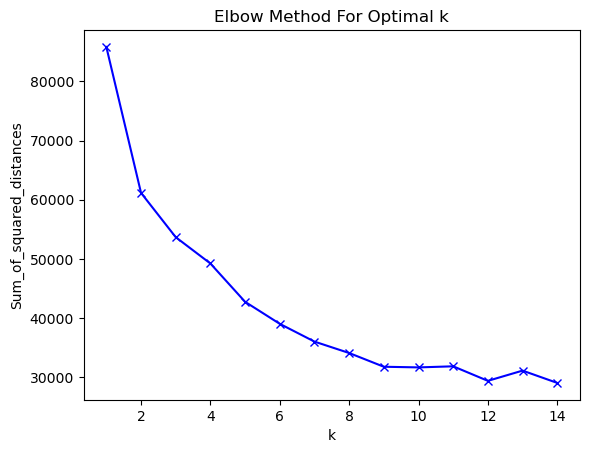

In [28]:
# use the elbow method to work out a more optimal number of clusters
# where the 'elbow' of the plot lies, this is suggested to be the optimum number for k

Sum_of_squared_distances = []

K_range = range(1,15)

for k in K_range:
 km = KMeans(n_clusters=k)
 km = km.fit(z_score_df)
 Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K_range, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

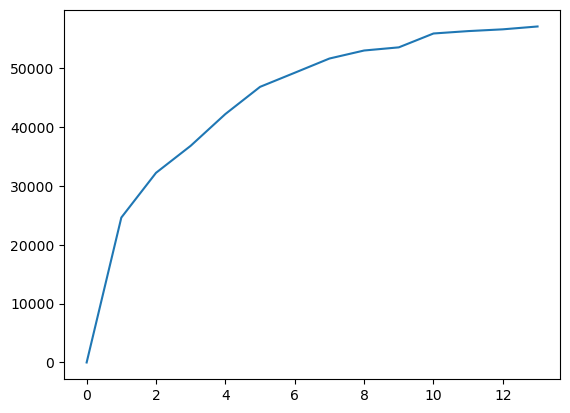

In [29]:
# the elbow appears to lie around 4, therefore the number of clusters will be adjusted appropriately

# I will also use a between-cluster sum of squares to measure the distinctiveness of 
# each cluster

import numpy as np
def elbow(dataframe, n):
    kMeansVar = [KMeans(n_clusters=k).fit(dataframe.values) for k in range(1, n)] #making use of list comprehensions.
    centroids = [X.cluster_centers_ for X in kMeansVar]
    k_euclid = [cdist(dataframe.values, cent) for cent in centroids]
    dist = [np.min(ke, axis=1) for ke in k_euclid]
    wcss = [sum(d**2) for d in dist]
    tss = sum(pdist(dataframe.values)**2)/dataframe.values.shape[0]
    bss = tss - wcss
    plt.plot(bss)
    plt.show()
 
elbow(z_score_df,15)

In [30]:
# KMeans with 4 clusters, after the validation with the Elbow method.
kmeans = KMeans(n_clusters=4)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_

z_score_df['Cluster'] = kmeans.labels_

z_score_df.head()

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,"Long-term illness, disease or condition_percentage",Mental health condition_percentage,Bad_percentage,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage,Cluster
0,1.610692,-1.014503e+00,-0.122594,-0.237394,-1.108017,-1.204796e-16,-0.126121,-1.197621,-0.506499,-0.626430,-1.013184,4.961891e-17,-0.751736,-0.202272,-0.624306,0
1,1.173324,-1.867411e-01,0.419851,0.448173,0.063994,-7.305562e-01,1.621516,-0.137614,-0.440552,0.430792,0.425491,4.961891e-17,-0.455908,0.016246,0.744991,1
2,-0.894965,-1.154130e-16,-0.766438,-1.130082,-1.022054,-7.199315e-01,-0.643279,-0.702893,0.112360,1.493707,0.409210,-1.108015e+00,-0.354993,-0.049732,-1.219055,0
3,1.098794,-1.520445e-01,-0.989117,0.056231,-0.574825,-9.176436e-01,0.574545,-0.425901,-0.245709,1.421669,-0.513524,4.961891e-17,-0.436195,-0.295986,-0.379051,0
4,0.641189,-2.010478e-01,0.012347,0.882365,-0.208817,-1.727585e-01,0.572554,-0.440370,0.303531,2.421386,-1.402124,-7.056065e-01,1.182209,-0.209769,0.749125,1


(array([2913.,    0.,    0.,  746.,    0.,    0.,  548.,    0.,    0.,
         245.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <BarContainer object of 10 artists>)

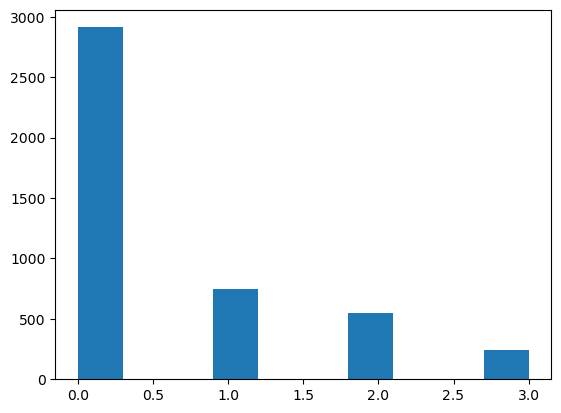

In [31]:
plt.hist(labels)

This section implements k-means clustering, assesses its suitability for this dataset.

The above histogram shows a roughly even split between clusters suggesting that 4 clusters is an appropriate split

# Evaluating the classification 

In [32]:
# To evaluate the variables selected, principal component analysis (pca) is carried out
# This attempts to simplify the variability of the clusters and their geographic distribution
# Code is adapted from the following source: 
# https://scikit-learn.org/stable/auto_examples/decomposition/plot_pca_iris.html#sphx-glr-auto-examples-decomposition-plot-pca-iris-py


import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

plt.figure(figsize=(12, 8))

kmeans = KMeans(n_clusters=4)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# code for PCA
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

# Create a scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 #title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")

These two components explain 41.87% of the point variability.


<Figure size 1200x800 with 0 Axes>

Cluster 4 is shown to be not very represented in the above plot, suggesting the variables chosen might have some limitations 

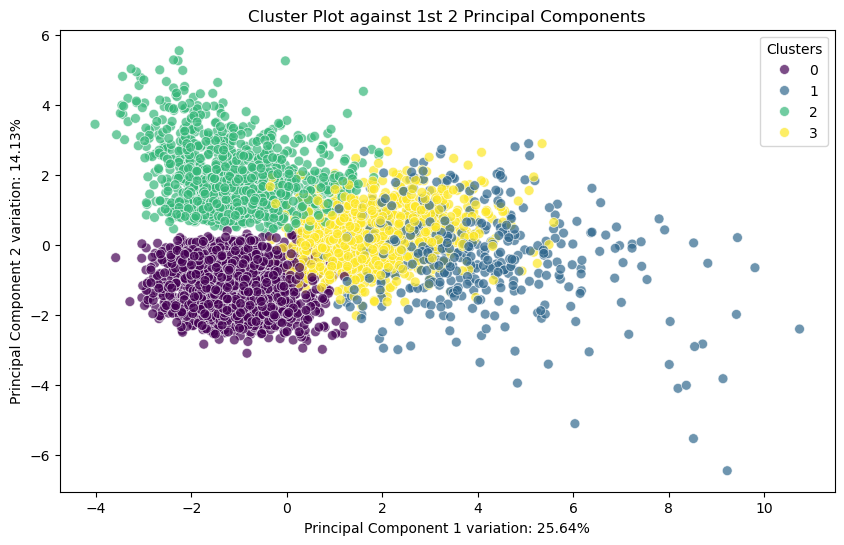

In [33]:
# assessing the variability in of each component included 

kmeans = KMeans(n_clusters=4)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

# Standardize the data for PCA
scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=clusters, palette='viridis', s=50, alpha=0.7)
plt.title('Cluster Plot against 1st 2 Principal Components')
plt.xlabel(f'Principal Component 1 variation: {variance_ratio[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 variation: {variance_ratio[1]*100:.2f}%')
plt.legend(title='Clusters')
plt.show()

In [34]:
# visualising the cluster centroids 

kmeans = KMeans(n_clusters=4)
clusters = kmeans.fit_predict(z_score_df)

cluster_centers = kmeans.cluster_centers_

cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=z_score_df.columns)

cluster_centers.head(4)

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,"Long-term illness, disease or condition_percentage",Mental health condition_percentage,Bad_percentage,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage,Cluster
0,0.880868,0.179140,0.196617,0.102100,0.328302,-0.021735,0.452040,-0.096597,0.710437,1.066683,-0.186424,0.131952,0.295337,0.025327,0.748448,2.993314e+00
1,-0.064462,-0.158532,-0.054100,-0.737273,-0.424326,-0.163893,-0.255755,-0.696248,-0.437842,-0.394442,-0.181594,-0.106297,-0.156029,-0.113188,-0.279414,-3.552714e-15
2,-0.168293,0.305325,1.550361,1.172039,1.865948,1.184358,1.332372,-0.052667,1.747813,0.895858,-0.424940,0.362621,0.596324,0.963231,0.429311,1.004866e+00
3,-0.652787,-0.014507,-0.661124,0.705497,-0.281906,-0.140113,-0.483171,1.271087,-0.572672,-0.665436,0.632603,-0.078612,-0.233707,-0.187627,-0.389490,2.000891e+00


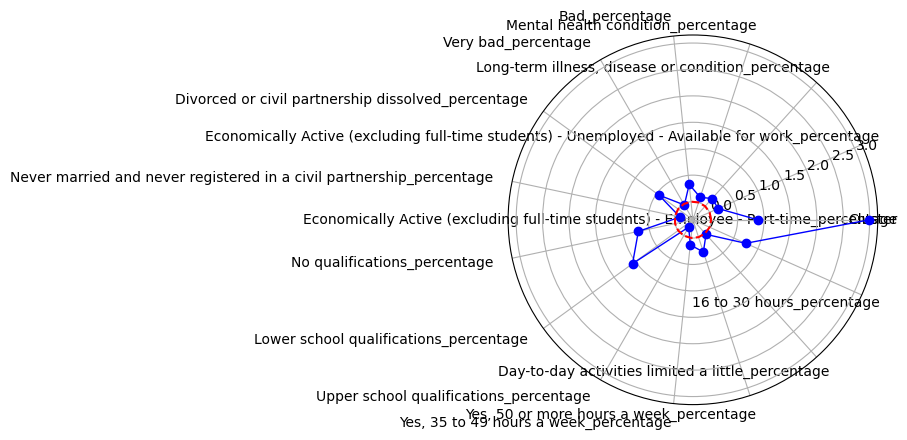

In [35]:
first_row_centers = cluster_centers.iloc[0, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()

### map the clusters

In [36]:
list(z_score_df.columns)

['Economically Active (excluding full-time students) - Employee - Part-time_percentage',
 'Economically Active (excluding full-time students) - Unemployed - Available for work_percentage',
 'Long-term illness, disease or condition_percentage',
 'Mental health condition_percentage',
 'Bad_percentage',
 'Very bad_percentage',
 'Divorced or civil partnership dissolved_percentage',
 'Never married and never registered in a civil partnership_percentage',
 'No qualifications_percentage',
 'Lower school qualifications_percentage',
 'Upper school qualifications_percentage',
 'Yes, 35 to 49 hours a week_percentage',
 'Yes, 50 or more hours a week_percentage',
 'Day-to-day activities limited a little_percentage',
 '16 to 30 hours_percentage',
 'Cluster']

In [37]:
# drop all of the above columns aside from 'Cluster'

z_score_df.drop([
 'Economically Active (excluding full-time students) - Employee - Part-time_percentage',
 'Economically Active (excluding full-time students) - Unemployed - Available for work_percentage',
 'Long-term illness, disease or condition_percentage',
 'Mental health condition_percentage',
 'Bad_percentage',
 'Very bad_percentage',
 'Divorced or civil partnership dissolved_percentage',
 'Never married and never registered in a civil partnership_percentage',
 'No qualifications_percentage',
 'Lower school qualifications_percentage',
 'Upper school qualifications_percentage',
 'Yes, 35 to 49 hours a week_percentage',
 'Yes, 50 or more hours a week_percentage',
 'Day-to-day activities limited a little_percentage',
 '16 to 30 hours_percentage'], axis=1, inplace=True)
z_score_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4452 entries, 0 to 4451
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   Cluster  4452 non-null   int32
dtypes: int32(1)
memory usage: 17.5 KB


In [38]:
final_df = pd.concat([edinburgh_census_data, z_score_df], axis=1, ignore_index=False)
final_df.head()

,code,Popcount,HHcount,geometry,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,"Long-term illness, disease or condition_percentage",Mental health condition_percentage,Bad_percentage,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage,Cluster
0,S00181358,152,57,MULTIPOLYGON (((311997.1772359935 665293.93999...,18.110236,0.787402,17.763158,10.526316,0.657895,NaN,7.086614,22.047244,6.299213,9.448819,4.724409,NaN,1.342282,18.478261,15.217391,0
1,S00145082,107,53,"POLYGON ((322938.99959999975 669278, 322859.99...",16.091954,2.298851,21.495327,14.953271,4.672897,0.934579,14.942529,43.678161,6.896552,18.390805,13.793103,NaN,1.886792,27.118644,25.423729,3
2,S00144968,163,74,"POLYGON ((322558.1286000004 669284.7050000001,...",6.547619,NaN,13.333333,4.761905,0.952381,0.952381,4.761905,32.142857,11.904762,27.380952,13.690476,0.518135,2.072539,24.509804,10.784314,0
3,S00145050,161,73,"POLYGON ((323159.99959999975 669427, 323155.99...",15.748031,2.362205,11.801242,12.422360,2.484472,0.621118,10.236220,37.795276,8.661417,26.771654,7.874016,NaN,1.923077,14.772727,17.045455,3
4,S00145009,107,41,"POLYGON ((322732.9985999996 669511, 322827.999...",13.636364,2.272727,18.691589,17.757009,3.738318,1.869159,10.227273,37.500000,13.636364,35.227273,2.272727,0.980392,4.901961,18.181818,25.454545,3


In [46]:
# convert into a gdf to allow the map to plot 
from shapely import wkt

final df['geometry'] = final_df['geometry'].apply(wkt.loads)

final_gdf = gpd.GeoDataFrame(final_df, geometry='geometry')


<Axes: >

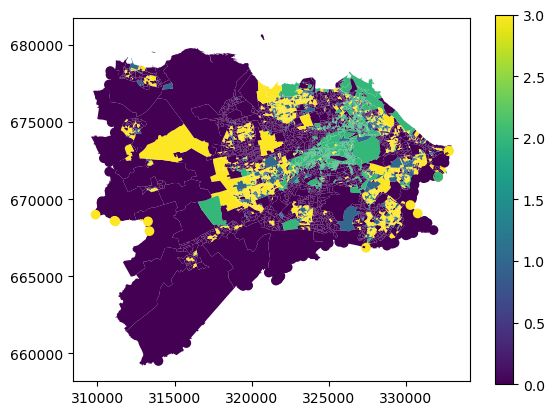

In [54]:
final_gdf.plot(column='Cluster', legend=True)

Using .plot instead of .explore to visualise the results due to a glitch in the computer system. 
Can see that similar neighbourhoods in cluster 0 are mainly distributed along the outskirts and suburbs of Edinburgh, while neighbourhoods with similar characteristics in cluster 2 are distributed throughout the centre of the city and towards the North East.

### Adjusting the parameters 

While the above plot is very useful for clustering, I will adapt the columns selected in the variables to create an alternative way of classifying the neighbourhoods, as the above methods to check the variables suggest there may be better variable selection. 

The following section will follow very similar steps to the above classification method, just with different variables selected 

In [55]:
# creating a function that calculates the percentage of each characteristic in the output areas

def calculate_percentages(dataframe, total_columns, value_columns):

    result_df_2 = pd.DataFrame()

    for total_col, value_col in zip(total_columns, value_columns):
        percentage_col_name = f"{value_col}_percentage"

        if total_col not in dataframe.columns:
            raise ValueError(f"Total column '{total_col}' not found in the DataFrame.")
        dataframe[value_col] = pd.to_numeric(dataframe[value_col], errors='coerce')
        dataframe[total_col] = pd.to_numeric(dataframe[total_col], errors='coerce')
        
        result_df_2[percentage_col_name] = (dataframe[value_col] / dataframe[total_col]) * 100

    return result_df_2

# List of the corresponding totals.
total_cols = [
              'All people aged 16 and over', 'All people aged 16 and over',
              'All people.1', 
              'All people.2','All people.2', 'All people.2',
              'All people aged 16 and over.1', 'All people aged 16 and over.1',
              'All people aged 16 and over.2','All people aged 16 and over.2', 'All people aged 16 and over.2',
              'All people aged 3 and over', 
              'All people.2',
              'All people aged 16 and over in employment the week before the census.1', 'All people aged 16 and over in employment the week before the census.1',
              'All people aged 16 and over in employment the week before the census.1', 'All occupied households', 'All occupied households',
              ]

# List of the corresponding values. 
value_cols = ['Economically Active (excluding full-time students) - Employee - Part-time', 'Economically inactive - Long term sick or disabled', 
              'Mental health condition',
              'Bad', 'Very bad', 'Fair', 
              'Divorced or civil partnership dissolved', 
              'Never married and never registered in a civil partnership',
              'No qualifications', 'Upper school qualifications', 'Apprenticeship qualifications',
              'All unpaid carers',
              'Day-to-day activities limited a little',
              '0 to 15 hours', '16 to 30 hours', '31 to 48 hours',
              'Gas central heating: Mains gas', 'No central heating']
              
result_dataframe_2 = calculate_percentages(merged_data, total_cols, value_cols)


In [56]:
result_dataframe.head()

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically Active (excluding full-time students) - Unemployed - Available for work_percentage,"Long-term illness, disease or condition_percentage",Mental health condition_percentage,Bad_percentage,Very bad_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Lower school qualifications_percentage,Upper school qualifications_percentage,"Yes, 35 to 49 hours a week_percentage","Yes, 50 or more hours a week_percentage",Day-to-day activities limited a little_percentage,16 to 30 hours_percentage
0,18.110236,0.787402,17.763158,10.526316,0.657895,NaN,7.086614,22.047244,6.299213,9.448819,4.724409,NaN,1.342282,18.478261,15.217391
1,16.091954,2.298851,21.495327,14.953271,4.672897,0.934579,14.942529,43.678161,6.896552,18.390805,13.793103,NaN,1.886792,27.118644,25.423729
2,6.547619,NaN,13.333333,4.761905,0.952381,0.952381,4.761905,32.142857,11.904762,27.380952,13.690476,0.518135,2.072539,24.509804,10.784314
3,15.748031,2.362205,11.801242,12.422360,2.484472,0.621118,10.236220,37.795276,8.661417,26.771654,7.874016,NaN,1.923077,14.772727,17.045455
4,13.636364,2.272727,18.691589,17.757009,3.738318,1.869159,10.227273,37.500000,13.636364,35.227273,2.272727,0.980392,4.901961,18.181818,25.454545


In [57]:
concatenated_df_2 = pd.concat([merged_data, result_dataframe_2], axis=1, ignore_index=False)
concatenated_df_2.head()

,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,Shape_Leng,...,No qualifications_percentage,Upper school qualifications_percentage,Apprenticeship qualifications_percentage,All unpaid carers_percentage,Day-to-day activities limited a little_percentage,0 to 15 hours_percentage,16 to 30 hours_percentage,31 to 48 hours_percentage,Gas central heating: Mains gas_percentage,No central heating_percentage
0,S00181358,57,152,S12000040,42.406623,4240.66,EH27 8DJA,311694,664406,40559.974240,...,6.299213,4.724409,1.574803,18.791946,11.184211,16.304348,15.217391,51.086957,10.526316,1.754386
1,S00145082,53,107,S12000036,0.015435,1.54,EH13 9AG,322867,669374,522.905774,...,6.896552,13.793103,6.896552,6.603774,14.953271,11.864407,25.423729,57.627119,81.132075,7.547170
2,S00144968,74,163,S12000036,0.364902,36.49,EH13 0PS,322069,669312,3842.367627,...,11.904762,13.690476,13.095238,4.663212,11.904762,1.960784,10.784314,72.549020,60.810811,1.351351
3,S00145050,73,161,S12000036,0.027922,2.79,EH13 9AW,323016,669327,1189.877306,...,8.661417,7.874016,4.724409,7.051282,8.074534,11.363636,17.045455,65.909091,86.301370,1.369863
4,S00145009,41,107,S12000036,0.059002,5.90,EH13 9DS,322836,669578,1700.931906,...,13.636364,2.272727,2.272727,14.705882,9.345794,9.090909,25.454545,49.090909,82.926829,12.195122


In [58]:
list(concatenated_df_2.columns)

['code',
 'HHcount',
 'Popcount',
 'council',
 'sqkm',
 'hect',
 'masterpc',
 'easting',
 'northing',
 'Shape_Leng',
 'Shape_Area',
 'geometry',
 'oa_code',
 'All people aged 16 and over in employment the week before the census (including full-time students if they gave a work address as the address they primarily travel to for work or study)',
 'Mainly work from home',
 'Less than 2km',
 '2km to less than 5km',
 '5km to less than 10km',
 '10km to less than 20km',
 '20km to less than 30km',
 '30km to less than 40km',
 '40km to less than 60km',
 '60km and over',
 'Other - No fixed place of work or working outside the UK',
 'Unnamed: 0',
 'All people aged 16 and over',
 'Economically Active (excluding full time students) - Total',
 'Economically Active (excluding full-time students) - Employee - Total',
 'Economically Active (excluding full-time students) - Employee - Part-time',
 'Economically Active (excluding full-time students) - Employee - Full-time',
 'Economically Active (excludin

In [77]:
# Subsetting the attributes we need
keep_cols_2= [
    'code',
    'Popcount',
    'HHcount',
    'geometry','Economically Active (excluding full-time students) - Employee - Part-time_percentage',
 'Economically inactive - Long term sick or disabled_percentage',
 'Mental health condition_percentage',
 'Bad_percentage',
 'Very bad_percentage',
 'Fair_percentage',
 'Divorced or civil partnership dissolved_percentage',
 'Never married and never registered in a civil partnership_percentage',
 'No qualifications_percentage',
 'Upper school qualifications_percentage',
 'Apprenticeship qualifications_percentage',
 'All unpaid carers_percentage',
 'Day-to-day activities limited a little_percentage',
 '0 to 15 hours_percentage',
 '16 to 30 hours_percentage',
 '31 to 48 hours_percentage',
 'Gas central heating: Mains gas_percentage',
 'No central heating_percentage'
]

edinburgh_census_data_2 = concatenated_df_2[keep_cols_2]

In [78]:
edinburgh_census_data_2.shape

(4452, 22)

In [79]:
edinburgh_census_data_2.head()

,code,Popcount,HHcount,geometry,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically inactive - Long term sick or disabled_percentage,Mental health condition_percentage,Bad_percentage,Very bad_percentage,Fair_percentage,...,No qualifications_percentage,Upper school qualifications_percentage,Apprenticeship qualifications_percentage,All unpaid carers_percentage,Day-to-day activities limited a little_percentage,0 to 15 hours_percentage,16 to 30 hours_percentage,31 to 48 hours_percentage,Gas central heating: Mains gas_percentage,No central heating_percentage
0,S00181358,152,57,MULTIPOLYGON (((311997.1772359935 665293.93999...,18.110236,1.574803,10.526316,0.657895,NaN,11.184211,...,6.299213,4.724409,1.574803,18.791946,11.184211,16.304348,15.217391,51.086957,10.526316,1.754386
1,S00145082,107,53,"POLYGON ((322938.99959999975 669278, 322859.99...",16.091954,3.448276,14.953271,4.672897,0.934579,18.691589,...,6.896552,13.793103,6.896552,6.603774,14.953271,11.864407,25.423729,57.627119,81.132075,7.547170
2,S00144968,163,74,"POLYGON ((322558.1286000004 669284.7050000001,...",6.547619,NaN,4.761905,0.952381,0.952381,10.000000,...,11.904762,13.690476,13.095238,4.663212,11.904762,1.960784,10.784314,72.549020,60.810811,1.351351
3,S00145050,161,73,"POLYGON ((323159.99959999975 669427, 323155.99...",15.748031,3.149606,12.422360,2.484472,0.621118,8.074534,...,8.661417,7.874016,4.724409,7.051282,8.074534,11.363636,17.045455,65.909091,86.301370,1.369863
4,S00145009,107,41,"POLYGON ((322732.9985999996 669511, 322827.999...",13.636364,9.090909,17.757009,3.738318,1.869159,10.280374,...,13.636364,2.272727,2.272727,14.705882,9.345794,9.090909,25.454545,49.090909,82.926829,12.195122


In [80]:
# standardise the new dataframe variables using a z score

numeric_columns = edinburgh_census_data_2.select_dtypes(include='float64')
z_score_2 = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_2.head()

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically inactive - Long term sick or disabled_percentage,Mental health condition_percentage,Bad_percentage,Very bad_percentage,Fair_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Upper school qualifications_percentage,Apprenticeship qualifications_percentage,All unpaid carers_percentage,Day-to-day activities limited a little_percentage,0 to 15 hours_percentage,16 to 30 hours_percentage,31 to 48 hours_percentage,Gas central heating: Mains gas_percentage,No central heating_percentage
0,1.610692,-0.749530,-0.237394,-1.108017,NaN,-0.106176,-0.126121,-1.197621,-0.506499,-1.013184,-1.038626,1.981327,-0.217902,1.072097,-0.624306,-1.125691,-3.711430,-0.854714
1,1.173324,-0.370796,0.448173,0.063994,-0.730556,1.146947,1.621516,-0.137614,-0.440552,0.425491,0.460989,-0.740193,0.580267,0.390104,0.744991,-0.509361,0.075900,0.491687
2,-0.894965,NaN,-1.130082,-1.022054,-0.719932,-0.303843,-0.643279,-0.702893,0.112360,0.409210,2.207716,-1.173505,-0.065312,-1.131134,-1.219055,0.896844,-1.014143,-0.948390
3,1.098794,-0.431174,0.056231,-0.574825,-0.917644,-0.625240,0.574545,-0.425901,-0.245709,-0.513524,-0.151099,-0.640268,-0.876434,0.313183,-0.379051,0.271113,0.353184,-0.944088
4,0.641189,0.769896,0.882365,-0.208817,-0.172759,-0.257043,0.572554,-0.440370,0.303531,-1.402124,-0.841958,1.068942,-0.607221,-0.035917,0.749125,-1.313794,0.172172,1.571998


In [81]:
corr2 = z_score_2.corr()
corr2.style.background_gradient(cmap='coolwarm')

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically inactive - Long term sick or disabled_percentage,Mental health condition_percentage,Bad_percentage,Very bad_percentage,Fair_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Upper school qualifications_percentage,Apprenticeship qualifications_percentage,All unpaid carers_percentage,Day-to-day activities limited a little_percentage,0 to 15 hours_percentage,16 to 30 hours_percentage,31 to 48 hours_percentage,Gas central heating: Mains gas_percentage,No central heating_percentage
Economically Active (excluding full-time students) - Employee - Part-time_percentage,1.000000,0.127374,-0.070301,0.075562,0.008978,0.070724,0.147584,-0.225020,0.233672,-0.215109,0.214231,0.246078,0.020372,-0.159907,0.535060,-0.214101,0.104808,-0.092873
Economically inactive - Long term sick or disabled_percentage,0.127374,1.000000,0.558881,0.643718,0.466832,0.545020,0.426999,0.137980,0.622243,-0.166524,0.106649,0.115002,0.372686,-0.022814,0.262773,-0.101842,-0.140394,-0.032512
Mental health condition_percentage,-0.070301,0.558881,1.000000,0.446545,0.331135,0.378941,0.227370,0.638917,0.297031,0.128158,-0.090400,-0.178305,0.337114,0.101469,0.098770,0.007374,-0.322597,0.282767
Bad_percentage,0.075562,0.643718,0.446545,1.000000,0.435413,0.582819,0.489001,0.028675,0.666479,-0.176357,0.200590,0.160331,0.440935,-0.025679,0.257568,-0.045149,-0.172500,-0.026084
Very bad_percentage,0.008978,0.466832,0.331135,0.435413,1.000000,0.407302,0.354721,0.002745,0.456872,-0.156083,0.130227,0.115470,0.255878,-0.022254,0.154864,-0.030912,-0.097895,-0.038296
Fair_percentage,0.070724,0.545020,0.378941,0.582819,0.407302,1.000000,0.459424,-0.035650,0.679075,-0.171439,0.282619,0.173535,0.623415,-0.018996,0.234269,-0.007431,-0.184657,-0.013091
Divorced or civil partnership dissolved_percentage,0.147584,0.426999,0.227370,0.489001,0.354721,0.459424,1.000000,-0.080900,0.495746,-0.228496,0.208531,0.117721,0.343087,-0.122852,0.190859,0.028955,-0.141038,-0.094541
Never married and never registered in a civil partnership_percentage,-0.225020,0.137980,0.638917,0.028675,0.002745,-0.035650,-0.080900,1.000000,-0.092041,0.327089,-0.282249,-0.468502,-0.016648,0.194271,-0.081078,0.064083,-0.349867,0.399093
No qualifications_percentage,0.233672,0.622243,0.297031,0.666479,0.456872,0.679075,0.495746,-0.092041,1.000000,-0.233974,0.330643,0.217941,0.438367,-0.056993,0.376128,-0.088203,-0.086476,-0.154673
Upper school qualifications_percentage,-0.215109,-0.166524,0.128158,-0.176357,-0.156083,-0.171439,-0.228496,0.327089,-0.233974,1.000000,-0.105184,-0.196433,-0.065899,0.516978,0.097235,-0.327923,-0.073460,0.055375


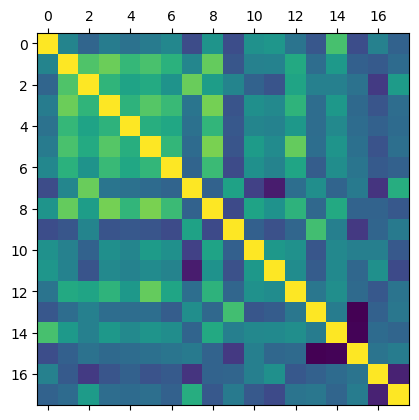

In [82]:
import matplotlib.pyplot as plt

plt.matshow(z_score_2.corr())
plt.show()

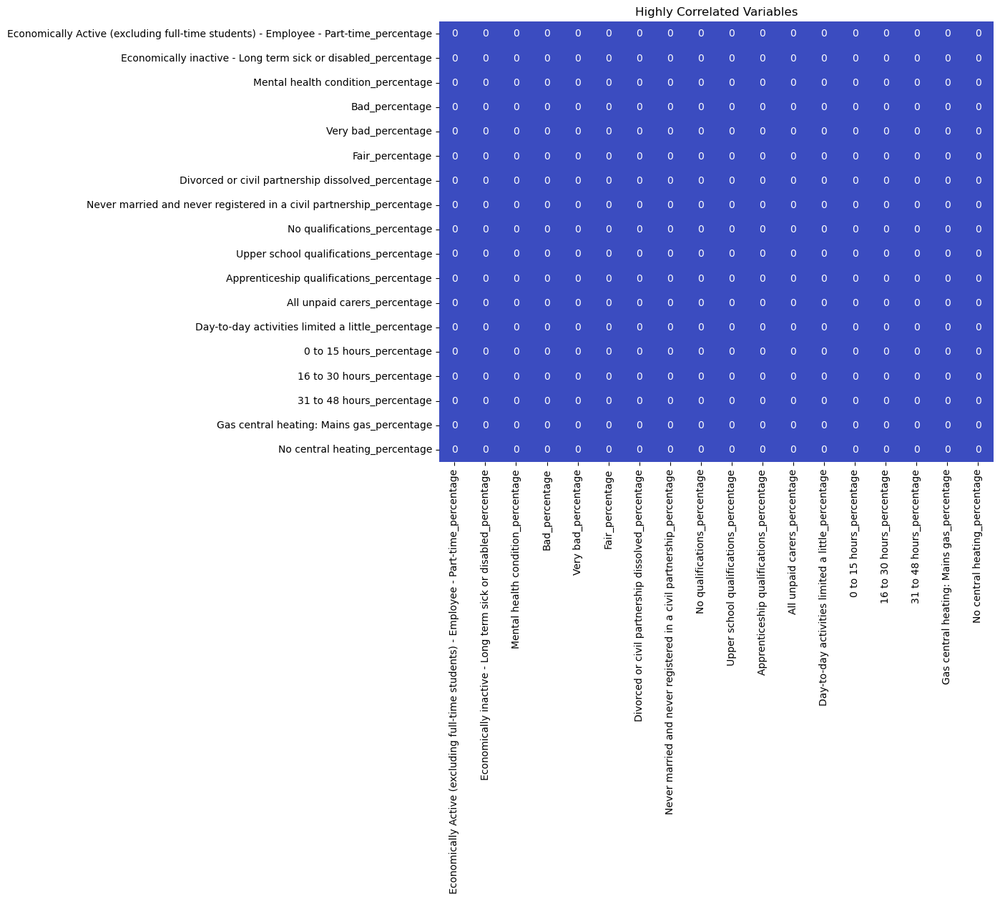

In [83]:
import seaborn as sns

threshold = 0.75 
highly_correlated_2 = (corr2.abs() > threshold) & (corr2.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_2, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show()


In [84]:
# check for nan values in the df
# as this is true, the next steps remove these values
contains_nan_2 = z_score_2.isna().any().any()
print(contains_nan_2)

True


In [85]:
z_score_2.fillna(z_score_2.mean(), inplace=True)

In [86]:
# clustering the new variable selection with 10 clusters now the data has been processed

from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist

# KMeans with 10 clusters
kmeans_2 = KMeans(n_clusters=10)
kmeans_2.fit(z_score_2)
labels_2 = kmeans_2.predict(z_score_2)
cluster_centres_2 = kmeans_2.cluster_centers_
z_score_2['Cluster'] = kmeans_2.labels_

In [87]:
z_score_2.head()

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically inactive - Long term sick or disabled_percentage,Mental health condition_percentage,Bad_percentage,Very bad_percentage,Fair_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Upper school qualifications_percentage,Apprenticeship qualifications_percentage,All unpaid carers_percentage,Day-to-day activities limited a little_percentage,0 to 15 hours_percentage,16 to 30 hours_percentage,31 to 48 hours_percentage,Gas central heating: Mains gas_percentage,No central heating_percentage,Cluster
0,1.610692,-7.495297e-01,-0.237394,-1.108017,-1.204796e-16,-0.106176,-0.126121,-1.197621,-0.506499,-1.013184,-1.038626,1.981327,-0.217902,1.072097,-0.624306,-1.125691,-3.711430,-0.854714,9
1,1.173324,-3.707959e-01,0.448173,0.063994,-7.305562e-01,1.146947,1.621516,-0.137614,-0.440552,0.425491,0.460989,-0.740193,0.580267,0.390104,0.744991,-0.509361,0.075900,0.491687,3
2,-0.894965,4.859167e-17,-1.130082,-1.022054,-7.199315e-01,-0.303843,-0.643279,-0.702893,0.112360,0.409210,2.207716,-1.173505,-0.065312,-1.131134,-1.219055,0.896844,-1.014143,-0.948390,1
3,1.098794,-4.311738e-01,0.056231,-0.574825,-9.176436e-01,-0.625240,0.574545,-0.425901,-0.245709,-0.513524,-0.151099,-0.640268,-0.876434,0.313183,-0.379051,0.271113,0.353184,-0.944088,9
4,0.641189,7.698964e-01,0.882365,-0.208817,-1.727585e-01,-0.257043,0.572554,-0.440370,0.303531,-1.402124,-0.841958,1.068942,-0.607221,-0.035917,0.749125,-1.313794,0.172172,1.571998,3


(array([667., 503., 811., 395., 339., 297., 249., 174., 376., 641.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <BarContainer object of 10 artists>)

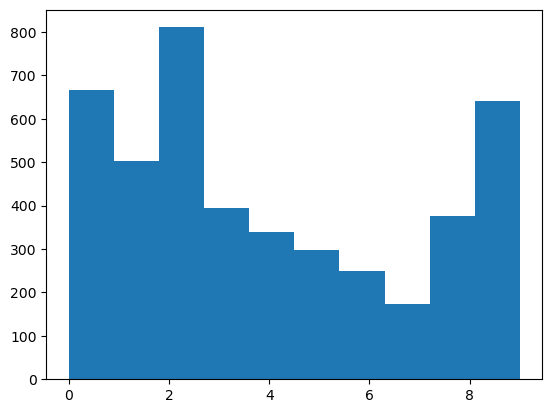

In [88]:
# plot histogram to assess distribution of clusters

plt.hist(labels_2)

# there is a better and more even distribution with these variables than the above variable selection
# although there is still no datapoints for cluster 6

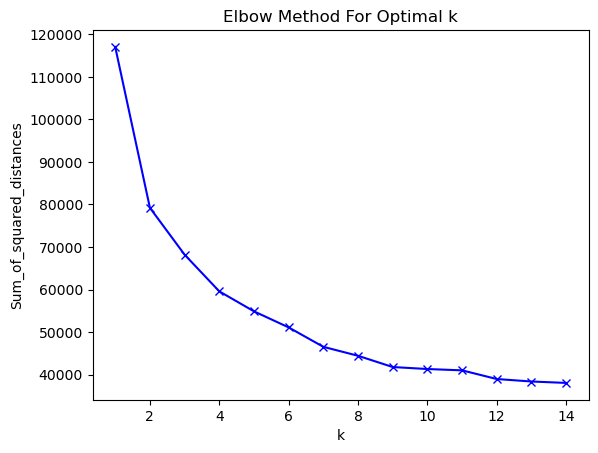

In [89]:
# assess the suitability of this number of clusters using the elbow method

Sum_of_squared_distances_2 = []

K_range_2 = range(1,15)

for k in K_range_2:
 km = KMeans(n_clusters=k)
 km = km.fit(z_score_2)
 Sum_of_squared_distances_2.append(km.inertia_)
    
plt.plot(K_range_2, Sum_of_squared_distances_2, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

# this shows the elbow lying around 5 or 6 clusters

In [90]:
# adjust to have 5 clusters as this appears to be where the elbow lies in the above graph

kmeans_2 = KMeans(n_clusters=5)
kmeans_2.fit(z_score_2)
labels_2 = kmeans_2.predict(z_score_2)
cluster_centres = kmeans_2.cluster_centers_

z_score_2['Cluster'] = kmeans_2.labels_

(array([ 868.,    0., 1171.,    0.,    0., 1162.,    0.,  251.,    0.,
        1000.]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <BarContainer object of 10 artists>)

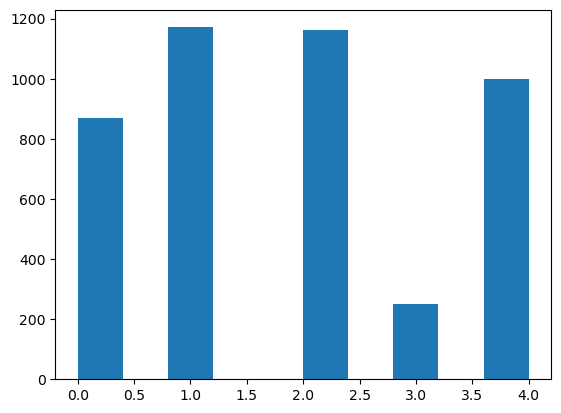

In [91]:
plt.hist(labels_2)

In [92]:
# evaluate the classification with the following plots

import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

plt.figure(figsize=(12, 8))

kmeans_2 = KMeans(n_clusters=5)
clusters_2 = kmeans.fit_predict(z_score_2)

z_score_2['Cluster'] = clusters_2

scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_2)

# PCA analysys.
pca_2 = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca_2.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca_2.explained_variance_ratio_

# Create a scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 #title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")


These two components explain 40.19% of the point variability.


<Figure size 1200x800 with 0 Axes>

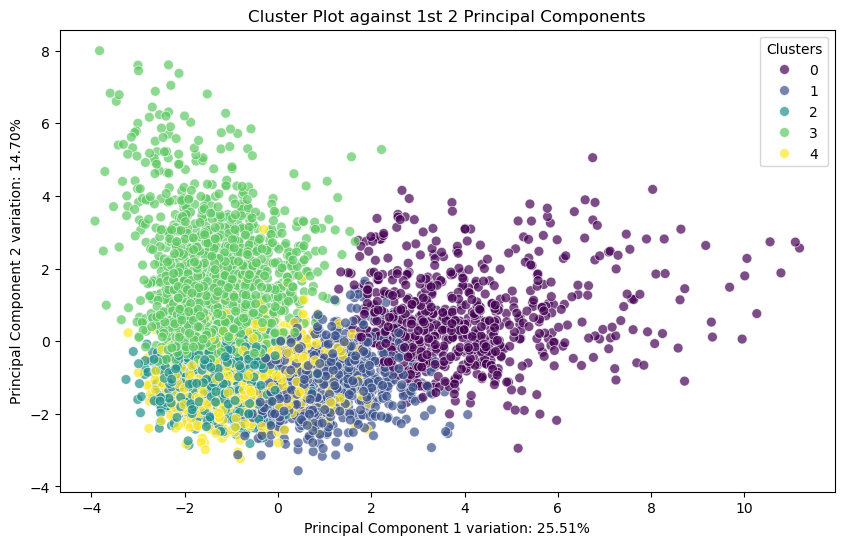

In [94]:
kmeans = KMeans(n_clusters=5)
clusters = kmeans.fit_predict(z_score_2)

z_score_2['Cluster'] = clusters

# Standardize the data for PCA
scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_2)

# PCA
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=clusters, palette='viridis', s=50, alpha=0.7)
plt.title('Cluster Plot against 1st 2 Principal Components')
plt.xlabel(f'Principal Component 1 variation: {variance_ratio[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 variation: {variance_ratio[1]*100:.2f}%')
plt.legend(title='Clusters')
plt.show()


# There appears to be significant overlap between clusters 4, 1 and 2 
# this may be a limitation of the current variable choice 

In [96]:
# interpreting the clusters and plotting the cluster centres 

kmeans = KMeans(n_clusters=5)
clusters = kmeans.fit_predict(z_score_2)

cluster_centers = kmeans.cluster_centers_

cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=z_score_2.columns)

cluster_centers.head()

,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically inactive - Long term sick or disabled_percentage,Mental health condition_percentage,Bad_percentage,Very bad_percentage,Fair_percentage,Divorced or civil partnership dissolved_percentage,Never married and never registered in a civil partnership_percentage,No qualifications_percentage,Upper school qualifications_percentage,Apprenticeship qualifications_percentage,All unpaid carers_percentage,Day-to-day activities limited a little_percentage,0 to 15 hours_percentage,16 to 30 hours_percentage,31 to 48 hours_percentage,Gas central heating: Mains gas_percentage,No central heating_percentage,Cluster
0,-1.132590,-0.355627,0.710736,-0.482466,-0.255167,-0.553328,-0.796375,1.607110,-0.640931,2.782197,-0.651284,-1.062732,-0.202942,2.387334,0.347082,-1.559286,-0.419067,0.116060,3.000000
1,-0.206171,-0.290667,-0.678853,-0.294811,-0.132162,-0.231401,-0.151390,-0.710449,-0.221753,-0.143743,0.253546,0.320694,-0.186138,-0.241005,-0.373223,0.287385,0.436605,-0.196489,1.629831
2,0.313510,1.091913,0.910468,1.262890,0.594690,1.268161,1.002883,0.106790,1.352769,-0.329384,0.328832,0.292001,0.948497,-0.042559,0.615815,-0.183522,-0.343874,-0.063702,0.216063
3,1.021029,-0.238627,-0.545085,-0.308477,-0.165074,-0.286883,-0.150808,-0.596151,-0.135317,-0.100538,-0.022288,0.387175,-0.243367,0.077085,0.781074,-0.689806,0.292704,-0.134734,3.996259
4,-0.483735,-0.245293,0.435859,-0.299780,-0.128311,-0.393901,-0.326076,0.984499,-0.575875,-0.129699,-0.463467,-0.742964,-0.306272,-0.275556,-0.687169,0.671695,-0.451729,0.410695,2.987415


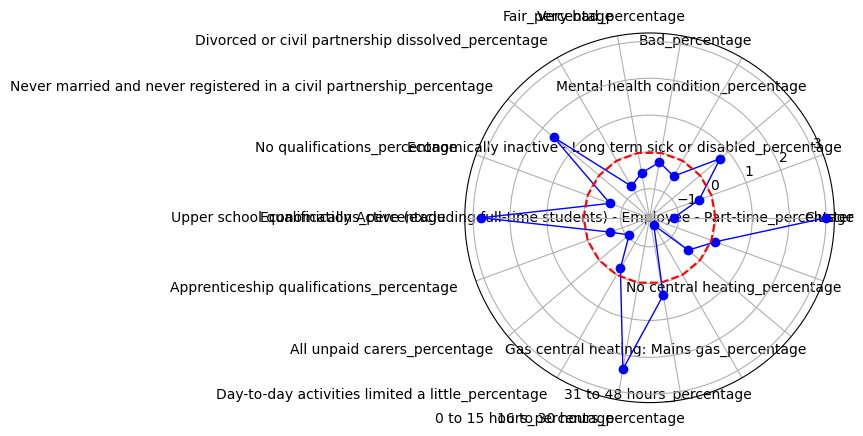

In [102]:
first_row_centers = cluster_centers.iloc[0, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()

# this shows where the cluster centres lie on each variable. 
# it suggests that those with poor health have a lower cluster and the higher clusters have 
# higher qualifications and work part time or 31-38 hours per week
# this information will be used when naming the different clusters

In [103]:
# map the 2nd geodemographic classification

list(z_score_2.columns)

['Cluster']

In [ ]:
z_score_2.drop(['Economically Active (excluding full-time students) - Employee - Part-time_percentage',
 'Economically inactive - Long term sick or disabled_percentage',
 'Mental health condition_percentage',
 'Bad_percentage',
 'Very bad_percentage',
 'Fair_percentage',
 'Divorced or civil partnership dissolved_percentage',
 'Never married and never registered in a civil partnership_percentage',
 'No qualifications_percentage',
 'Upper school qualifications_percentage',
 'Apprenticeship qualifications_percentage',
 'All unpaid carers_percentage',
 'Day-to-day activities limited a little_percentage',
 '0 to 15 hours_percentage',
 '16 to 30 hours_percentage',
 '31 to 48 hours_percentage',
 'Gas central heating: Mains gas_percentage',
 'No central heating_percentage'
], axis=1, inplace=True)
z_score_df.info()

In [105]:
final_df_2 = pd.concat([edinburgh_census_data_2, z_score_2], axis=1, ignore_index=False)
final_df_2.head()

,code,Popcount,HHcount,geometry,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically inactive - Long term sick or disabled_percentage,Mental health condition_percentage,Bad_percentage,Very bad_percentage,Fair_percentage,...,Upper school qualifications_percentage,Apprenticeship qualifications_percentage,All unpaid carers_percentage,Day-to-day activities limited a little_percentage,0 to 15 hours_percentage,16 to 30 hours_percentage,31 to 48 hours_percentage,Gas central heating: Mains gas_percentage,No central heating_percentage,Cluster
0,S00181358,152,57,MULTIPOLYGON (((311997.1772359935 665293.93999...,18.110236,1.574803,10.526316,0.657895,NaN,11.184211,...,4.724409,1.574803,18.791946,11.184211,16.304348,15.217391,51.086957,10.526316,1.754386,4
1,S00145082,107,53,"POLYGON ((322938.99959999975 669278, 322859.99...",16.091954,3.448276,14.953271,4.672897,0.934579,18.691589,...,13.793103,6.896552,6.603774,14.953271,11.864407,25.423729,57.627119,81.132075,7.547170,4
2,S00144968,163,74,"POLYGON ((322558.1286000004 669284.7050000001,...",6.547619,NaN,4.761905,0.952381,0.952381,10.000000,...,13.690476,13.095238,4.663212,11.904762,1.960784,10.784314,72.549020,60.810811,1.351351,1
3,S00145050,161,73,"POLYGON ((323159.99959999975 669427, 323155.99...",15.748031,3.149606,12.422360,2.484472,0.621118,8.074534,...,7.874016,4.724409,7.051282,8.074534,11.363636,17.045455,65.909091,86.301370,1.369863,4
4,S00145009,107,41,"POLYGON ((322732.9985999996 669511, 322827.999...",13.636364,9.090909,17.757009,3.738318,1.869159,10.280374,...,2.272727,2.272727,14.705882,9.345794,9.090909,25.454545,49.090909,82.926829,12.195122,4


In [106]:
final_df_2.columns

Index(['code', 'Popcount', 'HHcount', 'geometry',
       'Economically Active (excluding full-time students) - Employee - Part-time_percentage',
       'Economically inactive - Long term sick or disabled_percentage',
       'Mental health condition_percentage', 'Bad_percentage',
       'Very bad_percentage', 'Fair_percentage',
       'Divorced or civil partnership dissolved_percentage',
       'Never married and never registered in a civil partnership_percentage',
       'No qualifications_percentage',
       'Upper school qualifications_percentage',
       'Apprenticeship qualifications_percentage',
       'All unpaid carers_percentage',
       'Day-to-day activities limited a little_percentage',
       '0 to 15 hours_percentage', '16 to 30 hours_percentage',
       '31 to 48 hours_percentage',
       'Gas central heating: Mains gas_percentage',
       'No central heating_percentage', 'Cluster'],
      dtype='object')

In [107]:
# renaming the clusters using a dictionary 
# as the cluster values are integers and not string, this is the best method to rename

def rename_column(x): 
    rename_clusters = {
        0: "Very high priority",
        1: "High priority",
        2: "Moderate priority",
        3: "Low priority",
        4: "Very low priority"
    }
    return rename_clusters.get(x, x)  
    
final_df_2['Cluster'] = final_df_2['Cluster'].apply(rename_column)
final_df_2.head()

,code,Popcount,HHcount,geometry,Economically Active (excluding full-time students) - Employee - Part-time_percentage,Economically inactive - Long term sick or disabled_percentage,Mental health condition_percentage,Bad_percentage,Very bad_percentage,Fair_percentage,...,Upper school qualifications_percentage,Apprenticeship qualifications_percentage,All unpaid carers_percentage,Day-to-day activities limited a little_percentage,0 to 15 hours_percentage,16 to 30 hours_percentage,31 to 48 hours_percentage,Gas central heating: Mains gas_percentage,No central heating_percentage,Cluster
0,S00181358,152,57,MULTIPOLYGON (((311997.1772359935 665293.93999...,18.110236,1.574803,10.526316,0.657895,NaN,11.184211,...,4.724409,1.574803,18.791946,11.184211,16.304348,15.217391,51.086957,10.526316,1.754386,Very low priority
1,S00145082,107,53,"POLYGON ((322938.99959999975 669278, 322859.99...",16.091954,3.448276,14.953271,4.672897,0.934579,18.691589,...,13.793103,6.896552,6.603774,14.953271,11.864407,25.423729,57.627119,81.132075,7.547170,Very low priority
2,S00144968,163,74,"POLYGON ((322558.1286000004 669284.7050000001,...",6.547619,NaN,4.761905,0.952381,0.952381,10.000000,...,13.690476,13.095238,4.663212,11.904762,1.960784,10.784314,72.549020,60.810811,1.351351,High priority
3,S00145050,161,73,"POLYGON ((323159.99959999975 669427, 323155.99...",15.748031,3.149606,12.422360,2.484472,0.621118,8.074534,...,7.874016,4.724409,7.051282,8.074534,11.363636,17.045455,65.909091,86.301370,1.369863,Very low priority
4,S00145009,107,41,"POLYGON ((322732.9985999996 669511, 322827.999...",13.636364,9.090909,17.757009,3.738318,1.869159,10.280374,...,2.272727,2.272727,14.705882,9.345794,9.090909,25.454545,49.090909,82.926829,12.195122,Very low priority


In [110]:
# make this into a gdf instead of only a df using the geometry column 
# convert the geometries into a format that can be read using shapely and WKT strings 

final_df_2['geometry'] = final_df_2['geometry'].apply(wkt.loads)

final_gdf_2 = gpd.GeoDataFrame(final_df_2, geometry='geometry')

<Axes: >

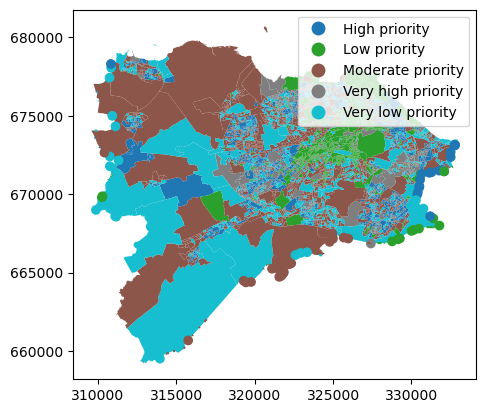

In [115]:
import warnings

warnings.filterwarnings('ignore')

final_gdf_2.plot(column='Cluster', legend=True)

The above plot shows that areas of low to moderate priority are mainly distributed around the outskirts of Edinburgh, and its suburbs as well as to the East of the city centre. 

Areas of higher priority for health concerns are more scattered accross the city, but areas of very high priority appear to be at the start of the suburbs of the city.

This clustering method appears to show a better distribution of clusters accross neighbourhoods, without one cluster dominating the plot. This is therefore more useful for analysis 

Geodemographic classification methods are inherently subjective based on the variables that are selected for the analysis and the classifications used. The combination of variables used greatly affects the outcome of the classification as can be seen by comparing the two different maps produced. The second set of variables used in this notebook appear to provide a more useful method of classifying the data. 

A challenge of this was deciding what variables to use. While Peterson et al. (2007) provided a background on which to base the variable decisions, further research into the variables would be useful. Additionally, researching the sepcific  context of Edinburgh as a city would be useful to help base decisions about variables. 

The above map is useful in showing what neighbourhoods are more likely to have poor health during the lifetime based on the classifications of lifestyle, economic, employment and health choices. This may be of use to public health boards or marketing for health campaigns. 

However, due to the variation in clusters at quite a small scale between neighbourhoods, the variables chosen may not be the best to address the above aim. Therefore , additional research into variables and their subjectivity is required. 

### References 

Petersen, J., Ashby, D. and Atkinson, P., 2007. Health Applications for Open Geodemographics. Geographical Information Science Research UK 2007.